# Comparative Analysis of Traffic Accident Hotspot Detection

Luke Zaruba, Bryan Runck

January 22, 2024

<br>

*Abstract here...*

In [1]:
# Imports
import contextily as ctx
import geopandas as gpd
import numpy as np
import pandas as pd
from esda import Moran_Local
from esda.adbscan import ADBSCAN, get_cluster_boundary
from matplotlib import pyplot as plt
from pysal.lib import weights
from shapely.geometry import Polygon

/Users/lukezaruba/miniconda3/envs/mnaccidents-env/lib/python3.9/site-packages/libpysal/cg/alpha_shapes.py:39: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def nb_dist(x, y):
/Users/lukezaruba/miniconda3/envs/mnaccidents-env/lib/python3.9/site-packages/libpysal/cg/alpha_shapes.py:165: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def get_faces(triangle):
/Users/

## Data

In [2]:
# Importing data
incidents_gdf = gpd.read_file("../data/inputs/INCIDENTS.geojson")
ctu_gdf = gpd.read_file("../data/inputs/CTU.geojson")
aadt_gdf = gpd.read_file("../data/inputs/AADT.geojson")

In [3]:
# Change CRS
ctu_gdf = ctu_gdf.to_crs(epsg=26915)
incidents_gdf = incidents_gdf.to_crs(epsg=26915)
aadt_gdf = aadt_gdf.to_crs(epsg=26915)

# Check if all are in EPSG 26915
aadt_gdf.crs.srs == ctu_gdf.crs.srs == incidents_gdf.crs.srs == "EPSG:26915"

True

## Verification Grid Creation

In [4]:
# Function to create a fishnet
def create_grid(boundary_gdf, grid_size):
    # Find Bounds
    xmin, ymin, xmax, ymax = boundary_gdf.total_bounds
    
    # Settings
    rows = int(np.ceil((ymax - ymin) /  grid_size))
    cols = int(np.ceil((xmax - xmin) / grid_size))

    left = xmin
    right = xmin + grid_size
    top = ymax
    bottom = ymax - grid_size
    
    # Create grid cells
    polygons = []
    for i in range(cols):
        Ytop = top
        Ybottom = bottom
        for j in range(rows):
            polygons.append(Polygon([(left, Ytop), (right, Ytop), (right, Ybottom), (left, Ybottom)])) 
            Ytop -= grid_size
            Ybottom -= grid_size
        left += grid_size
        right += grid_size
    
    # Create gdf
    bounds_grid = gpd.GeoDataFrame({"geometry":polygons}, crs=boundary_gdf.crs)
    
    # Filter out Grid Cells outside of boundary
    filtered_grid = gpd.sjoin(bounds_grid, boundary_gdf)

    grid = bounds_grid.loc[filtered_grid.index]
    
    # Return gdf
    return grid

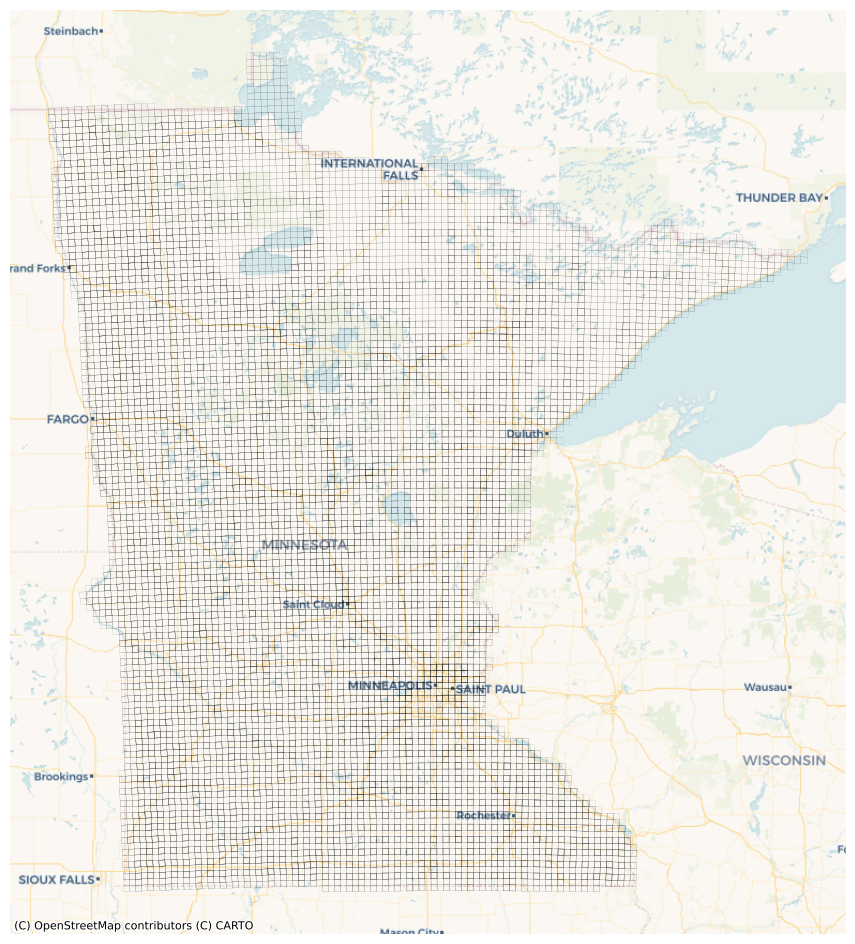

In [5]:
# 5000m grid
grid_5000 = create_grid(ctu_gdf, 5000)

# Plot
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

grid_5000.to_crs(epsg=3857).boundary.plot(
    ax=ax,
    alpha=0.5,
    edgecolor="black",
    linewidth=0.1,
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

ax.axis("off")
plt.show()

In [6]:
# Reset Index
grid_5000.reset_index(inplace=True, drop=True)
grid_5000.reset_index(inplace=True)

grid_5000.head()

,index,geometry
0,0,"POLYGON ((189783.466 5437346.499, 194783.466 5..."
1,1,"POLYGON ((189783.466 5432346.499, 194783.466 5..."
2,2,"POLYGON ((189783.466 5427346.499, 194783.466 5..."
3,3,"POLYGON ((194783.466 5437346.499, 199783.466 5..."
4,4,"POLYGON ((194783.466 5432346.499, 199783.466 5..."


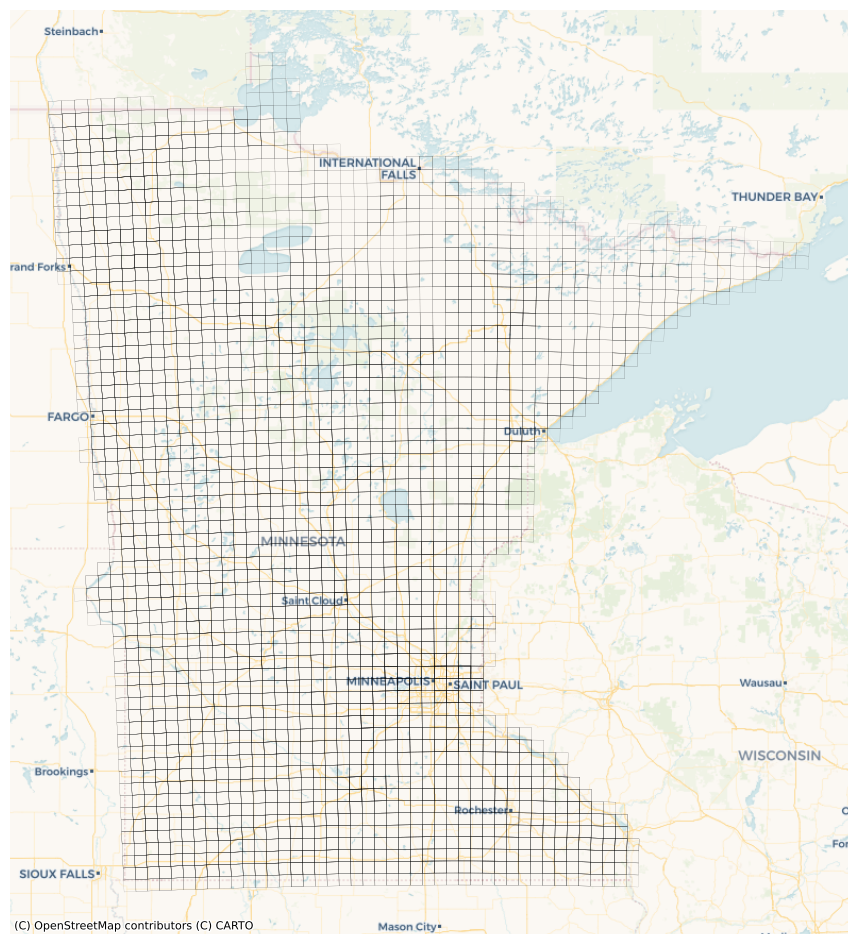

In [7]:
# 10000m grid
grid_10000 = create_grid(ctu_gdf, 10000)

# Plot
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

grid_10000.to_crs(epsg=3857).boundary.plot(
    ax=ax,
    alpha=0.5,
    edgecolor="black",
    linewidth=0.1,
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

ax.axis("off")
plt.show()

In [8]:
# Reset Index
grid_10000.reset_index(inplace=True, drop=True)
grid_10000.reset_index(inplace=True)

grid_10000.head()

,index,geometry
0,0,"POLYGON ((189783.466 5442346.499, 199783.466 5..."
1,1,"POLYGON ((189783.466 5432346.499, 199783.466 5..."
2,2,"POLYGON ((199783.466 5442346.499, 209783.466 5..."
3,3,"POLYGON ((199783.466 5432346.499, 209783.466 5..."
4,4,"POLYGON ((189783.466 5442346.499, 199783.466 5..."


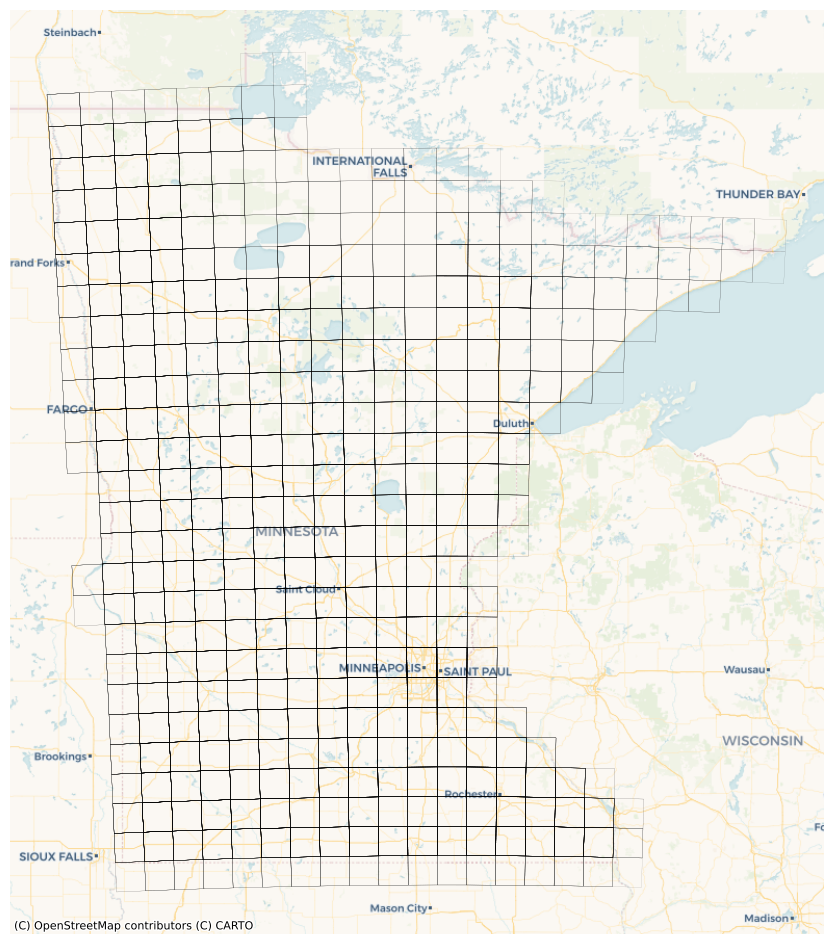

In [9]:
# 25000m grid
grid_25000 = create_grid(ctu_gdf, 25000)

# Plot
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

grid_25000.to_crs(epsg=3857).boundary.plot(
    ax=ax,
    alpha=0.5,
    edgecolor="black",
    linewidth=0.1,
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

ax.axis("off")
plt.show()

In [10]:
# Reset Index
grid_25000.reset_index(inplace=True, drop=True)
grid_25000.reset_index(inplace=True)

grid_25000.head()

,index,geometry
0,0,"POLYGON ((189783.466 5447346.499, 214783.466 5..."
1,1,"POLYGON ((189783.466 5422346.499, 214783.466 5..."
2,2,"POLYGON ((214783.466 5447346.499, 239783.466 5..."
3,3,"POLYGON ((214783.466 5422346.499, 239783.466 5..."
4,4,"POLYGON ((189783.466 5447346.499, 214783.466 5..."


## LISA

1. Queen's Contiguity Weights, Incident Density values
2. Queen's Contiguity Weights, Incident Intensity values

$$Incident\ Density = \frac{Incident\ Count}{Total\ Road\ Length}$$
$$Incident\ Intensity = \frac{Incident\ Count}{\frac{Total\ Traffic\ Volume}{Total\ Road\ Length}} = \frac{Incident\ Count \times Total\ Road\ Length}{Total\ Traffic\ Volume}$$

### Setup for LISA

In [11]:
# Cleaning up columns
ctu_gdf = ctu_gdf.drop(["predicted_count", "lmi_i", "lmi_q", "lmi_p", "lmi_sig", "lmi_label"], axis=1)

# Index
ctu_gdf.reset_index(inplace=True, drop=True)

# Avoiding div by 0 errors
ctu_gdf["total_road_length"] = ctu_gdf["total_road_length"].replace(0, 1)
ctu_gdf["aadt_sum"] = ctu_gdf["aadt_sum"].replace(0, 1)

# Z-Score Calculation
ctu_gdf["Z_TOTAL_AADT"] = (ctu_gdf["aadt_sum"] - ctu_gdf["aadt_sum"].mean())/ctu_gdf["aadt_sum"].std(ddof=0)
ctu_gdf["Z_ROAD_LENGTH"] = (ctu_gdf["total_road_length"] - ctu_gdf["total_road_length"].mean())/ctu_gdf["total_road_length"].std(ddof=0)

# Standardizing data
ctu_gdf["INCIDENT_INTENSITY"] = ctu_gdf["total_incident_count"] / (ctu_gdf["Z_TOTAL_AADT"] / ctu_gdf["Z_ROAD_LENGTH"])
ctu_gdf["INCIDENT_DENSITY"] = ctu_gdf["total_incident_count"] / ctu_gdf["total_road_length"]

# Getting values
lisa_density = ctu_gdf["INCIDENT_DENSITY"].values
lisa_intensity = ctu_gdf["INCIDENT_INTENSITY"].values

# Constructing weights
w = weights.Queen.from_dataframe(ctu_gdf)

In [12]:
# LISA Labels
lisa_labels = {
    0: "NS",
    1: "HH",
    2: "LH",
    3: "LL",
    4: "HL",
}

### Running LISA

In [13]:
# LISA - Density
moran_lisa_density = Moran_Local(lisa_density, w, seed=10)

ctu_gdf["LISA_DENSITY"] = pd.Series(
    moran_lisa_density.q * (1 * (moran_lisa_density.p_sim < 0.05)), index=ctu_gdf.index
).map(lisa_labels)

In [14]:
# LISA - Intensity
moran_lisa_intensity = Moran_Local(lisa_intensity, w, seed=10)

ctu_gdf["LISA_INTENSITY"] = pd.Series(
    moran_lisa_intensity.q * (1 * (moran_lisa_intensity.p_sim < 0.05)), index=ctu_gdf.index
).map(lisa_labels)

### Plotting LISA Results

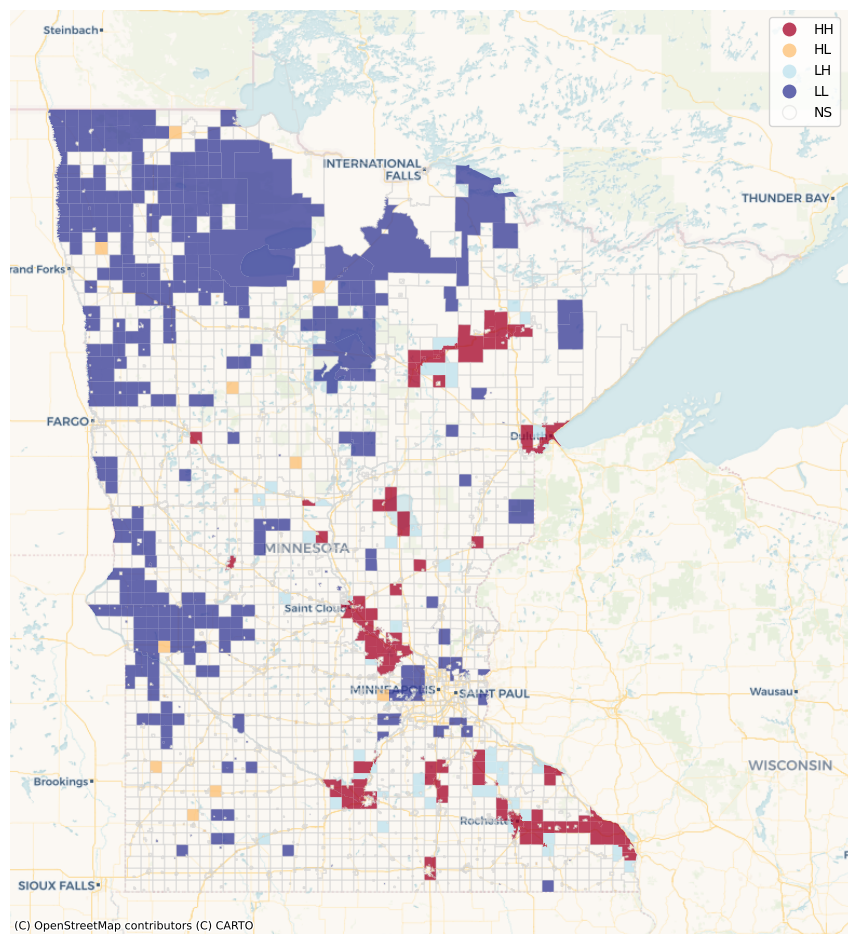

In [15]:
# Mapping LISA (Density) Results
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ctu_gdf_plot = ctu_gdf.copy()

ctu_gdf_plot.loc[ctu_gdf_plot["LISA_DENSITY"] == "NS", "LISA_DENSITY"] = None

ctu_gdf_plot.to_crs(epsg=3857).plot(
    ax=ax,
    column="LISA_DENSITY",
    alpha=0.75,
    legend=True,
    cmap="RdYlBu",
    missing_kwds={
        "color": "none",
        "edgecolor": "lightgrey",
        "alpha": 0.4,
        "label": "NS",
    },
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

ax.axis("off")
plt.show()

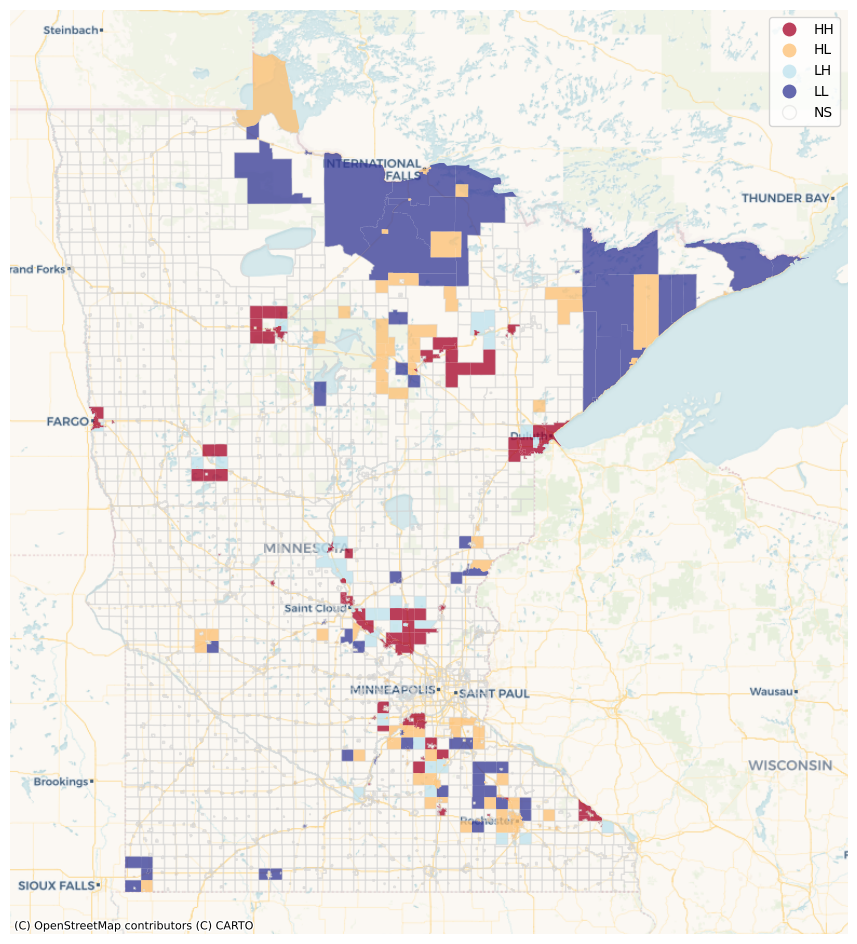

In [16]:
# Mapping LISA (Intensity) Results
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ctu_gdf_plot = ctu_gdf.copy()

ctu_gdf_plot.loc[ctu_gdf_plot["LISA_INTENSITY"] == "NS", "LISA_INTENSITY"] = None

ctu_gdf_plot.to_crs(epsg=3857).plot(
    ax=ax,
    column="LISA_INTENSITY",
    alpha=0.75,
    legend=True,
    cmap="RdYlBu",
    missing_kwds={
        "color": "none",
        "edgecolor": "lightgrey",
        "alpha": 0.4,
        "label": "NS",
    },
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

ax.axis("off")
plt.show()

### Adding to Grid

In [17]:
# LISA - Density (5000)
lisa_density_hotspots = ctu_gdf.loc[ctu_gdf.LISA_DENSITY == "HH"]
lisa_density_grid_5000 = gpd.sjoin(grid_5000, lisa_density_hotspots)

grid_5000["LISA_DENSITY"] = 0

for i in list(lisa_density_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "LISA_DENSITY"] = 1

In [18]:
# LISA - Density (10000)
lisa_density_hotspots = ctu_gdf.loc[ctu_gdf.LISA_DENSITY == "HH"]
lisa_density_grid_10000 = gpd.sjoin(grid_10000, lisa_density_hotspots)

grid_10000["LISA_DENSITY"] = 0

for i in list(lisa_density_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "LISA_DENSITY"] = 1

In [19]:
# LISA - Density (25000)
lisa_density_hotspots = ctu_gdf.loc[ctu_gdf.LISA_DENSITY == "HH"]
lisa_density_grid_25000 = gpd.sjoin(grid_25000, lisa_density_hotspots)

grid_25000["LISA_DENSITY"] = 0

for i in list(lisa_density_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "LISA_DENSITY"] = 1

In [20]:
# LISA - Intensity (5000)
lisa_intensity_hotspots = ctu_gdf.loc[ctu_gdf.LISA_INTENSITY == "HH"]
lisa_intensity_grid_5000 = gpd.sjoin(grid_5000, lisa_intensity_hotspots)

grid_5000["LISA_INTENSITY"] = 0

for i in list(lisa_intensity_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "LISA_INTENSITY"] = 1

In [21]:
# LISA - Intensity (10000)
lisa_intensity_hotspots = ctu_gdf.loc[ctu_gdf.LISA_INTENSITY == "HH"]
lisa_intensity_grid_10000 = gpd.sjoin(grid_10000, lisa_intensity_hotspots)

grid_10000["LISA_INTENSITY"] = 0

for i in list(lisa_intensity_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "LISA_INTENSITY"] = 1

In [22]:
# LISA - Intensity (25000)
lisa_intensity_hotspots = ctu_gdf.loc[ctu_gdf.LISA_INTENSITY == "HH"]
lisa_intensity_grid_25000 = gpd.sjoin(grid_25000, lisa_intensity_hotspots)

grid_25000["LISA_INTENSITY"] = 0

for i in list(lisa_intensity_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "LISA_INTENSITY"] = 1

## Network-Constrained LISA

1. Fuzzy Contiguity Weights, Incident Density values
2. Fuzzy Contiguity Weights, Incident Rate values
3. Fuzzy Contiguity Weights, Incident Intensity values
4. KNN Weights, Incident Density values
5. KNN Weights, Incident Rate values
6. KNN Weights, Incident Intensity values

$$Incident\ Rate = \frac{Incident\ Count}{Traffic\ Volume}$$
$$Incident\ Density = \frac{Incident\ Count}{Total\ Road\ Length}$$
$$Incident\ Intensity = \frac{Incident\ Count}{\frac{Traffic\ Volume}{Total\ Road\ Length}} = \frac{Incident\ Count \times Total\ Road\ Length}{Traffic\ Volume}$$

### Setup for LISA

In [23]:
# Drop Unneeded Columns
aadt_gdf = aadt_gdf.drop([c for c in aadt_gdf.columns if c not in ["CURRENT_VO", "geometry"]], axis=1)

# Remove invalid features
aadt_gdf = aadt_gdf.loc[aadt_gdf["geometry"].is_valid]

aadt_gdf.head()

,CURRENT_VO,geometry
0,629.0,"LINESTRING (478576.969 5118194.000, 478975.563..."
1,1712.0,"LINESTRING (478576.969 5118194.000, 478583.625..."
2,1192.0,"LINESTRING (459579.563 5120185.000, 459606.157..."
3,2712.0,"LINESTRING (442104.938 5132530.499, 442228.657..."
4,1109.0,"LINESTRING (442104.938 5132530.499, 442193.531..."


In [24]:
# Spatial Joining Incidents to Roads
joined_aadt = gpd.sjoin_nearest(incidents_gdf, aadt_gdf)

joined_aadt = joined_aadt.drop_duplicates("icr")

# Aggregating
point_counts_aadt = joined_aadt.groupby("index_right").size().reset_index(name="INCIDENT_COUNT")

# Join Counts Back to Lines
aadt_gdf = aadt_gdf.merge(point_counts_aadt, left_index=True, right_on="index_right", how="left")

# Fill any NaN values (lines with no nearby points) with 0
aadt_gdf["INCIDENT_COUNT"] = aadt_gdf["INCIDENT_COUNT"].fillna(0)

# Drop unnecessary columns
aadt_gdf.drop(columns=["index_right"], inplace=True)

aadt_gdf = aadt_gdf.reset_index(drop=True)

# Calculate the length of each road segment
aadt_gdf["LENGTH"] = aadt_gdf["geometry"].length

# Normalize accident counts
aadt_gdf["INCIDENT_DENSITY"] = aadt_gdf["INCIDENT_COUNT"] / aadt_gdf["LENGTH"]
aadt_gdf["INCIDENT_RATE"] = aadt_gdf["INCIDENT_COUNT"] / aadt_gdf["CURRENT_VO"]
aadt_gdf["INCIDENT_INTENSITY"] = aadt_gdf["INCIDENT_COUNT"] / (aadt_gdf["CURRENT_VO"] / aadt_gdf["LENGTH"])

# Get data values
nwk_lisa_rate = aadt_gdf["INCIDENT_RATE"].values
nwk_lisa_density = aadt_gdf["INCIDENT_DENSITY"].values
nwk_lisa_intensity = aadt_gdf["INCIDENT_INTENSITY"].values

aadt_gdf.head()

,CURRENT_VO,geometry,INCIDENT_COUNT,LENGTH,INCIDENT_DENSITY,INCIDENT_RATE,INCIDENT_INTENSITY
0,629.0,"LINESTRING (478576.969 5118194.000, 478975.563...",4.0,21544.491854,0.000186,0.006359,137.007897
1,1712.0,"LINESTRING (478576.969 5118194.000, 478583.625...",0.0,2644.750045,0.000000,0.000000,0.000000
2,1192.0,"LINESTRING (459579.563 5120185.000, 459606.157...",2.0,11354.308303,0.000176,0.001678,19.050853
3,2712.0,"LINESTRING (442104.938 5132530.499, 442228.657...",1.0,6587.415813,0.000152,0.000369,2.428988
4,1109.0,"LINESTRING (442104.938 5132530.499, 442193.531...",7.0,20312.608090,0.000345,0.006312,128.213036


In [25]:
# Weight Construction
w_fuzzy = weights.fuzzy_contiguity(aadt_gdf)
w_knn = weights.KNN.from_dataframe(aadt_gdf, k=5)

/Users/lukezaruba/miniconda3/envs/mnaccidents-env/lib/python3.9/site-packages/libpysal/weights/util.py:1665: FutureWarning: The `query_bulk()` method is deprecated and will be removed in GeoPandas 1.0. You can use the `query()` method instead.
  inp, res = gdf.sindex.query_bulk(gdf.geometry, predicate=predicate)
/Users/lukezaruba/miniconda3/envs/mnaccidents-env/lib/python3.9/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 682 disconnected components.
 There are 599 islands with ids: 3332, 6343, 7184, 9789, 9864, 10114, 10115, 10211, 11363, 11395, 11731, 12572, 12902, 12911, 13518, 14280, 14362, 14370, 15801, 16241, 16676, 16691, 17605, 18225, 18478, 20634, 20645, 20660, 20661, 20691, 20695, 21029, 21036, 21704, 22231, 22361, 22725, 22738, 27046, 27054, 27323, 27566, 27614, 27659, 27660, 27718, 27726, 27730, 27757, 27760, 27779, 27783, 27792, 27793, 27795, 27797, 27814, 27909, 28025, 28232, 28457, 28475, 28546, 28695, 28

### Running LISA

In [26]:
# LISA - Rate
moran_nwk_lisa_rate_fzy = Moran_Local(nwk_lisa_rate, w_fuzzy, seed=10)
moran_nwk_lisa_rate_knn = Moran_Local(nwk_lisa_rate, w_knn, seed=10)

aadt_gdf["LISA_RATE_FUZZY"] = pd.Series(moran_nwk_lisa_rate_fzy.q * (1 * (moran_nwk_lisa_rate_fzy.p_sim < 0.05)), index=aadt_gdf.index).map(lisa_labels)
aadt_gdf["LISA_RATE_KNN"] = pd.Series(moran_nwk_lisa_rate_knn.q * (1 * (moran_nwk_lisa_rate_knn.p_sim < 0.05)), index=aadt_gdf.index).map(lisa_labels)

('WARNING: ', 3332, ' is an island (no neighbors)')
('WARNING: ', 6343, ' is an island (no neighbors)')
('WARNING: ', 7184, ' is an island (no neighbors)')
('WARNING: ', 9789, ' is an island (no neighbors)')
('WARNING: ', 9864, ' is an island (no neighbors)')
('WARNING: ', 10114, ' is an island (no neighbors)')
('WARNING: ', 10115, ' is an island (no neighbors)')
('WARNING: ', 10211, ' is an island (no neighbors)')
('WARNING: ', 11363, ' is an island (no neighbors)')
('WARNING: ', 11395, ' is an island (no neighbors)')
('WARNING: ', 11731, ' is an island (no neighbors)')
('WARNING: ', 12572, ' is an island (no neighbors)')
('WARNING: ', 12902, ' is an island (no neighbors)')
('WARNING: ', 12911, ' is an island (no neighbors)')
('WARNING: ', 13518, ' is an island (no neighbors)')
('WARNING: ', 14280, ' is an island (no neighbors)')
('WARNING: ', 14362, ' is an island (no neighbors)')
('WARNING: ', 14370, ' is an island (no neighbors)')
('WARNING: ', 15801, ' is an island (no neighbors)'

/Users/lukezaruba/miniconda3/envs/mnaccidents-env/lib/python3.9/site-packages/esda/moran.py:1057: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


In [27]:
# LISA - Density
moran_nwk_lisa_density_fzy = Moran_Local(nwk_lisa_density, w_fuzzy, seed=10)
moran_nwk_lisa_density_knn = Moran_Local(nwk_lisa_density, w_knn, seed=10)

aadt_gdf["LISA_DENSITY_FUZZY"] = pd.Series(moran_nwk_lisa_density_fzy.q * (1 * (moran_nwk_lisa_density_fzy.p_sim < 0.05)), index=aadt_gdf.index).map(lisa_labels)
aadt_gdf["LISA_DENSITY_KNN"] = pd.Series(moran_nwk_lisa_density_knn.q * (1 * (moran_nwk_lisa_density_knn.p_sim < 0.05)), index=aadt_gdf.index).map(lisa_labels)

/Users/lukezaruba/miniconda3/envs/mnaccidents-env/lib/python3.9/site-packages/esda/moran.py:1057: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


In [28]:
# LISA - Intensity
moran_nwk_lisa_intensity_fzy = Moran_Local(nwk_lisa_intensity, w_fuzzy, seed=10)
moran_nwk_lisa_intensity_knn = Moran_Local(nwk_lisa_intensity, w_knn, seed=10)

aadt_gdf["LISA_INTENSITY_FUZZY"] = pd.Series(moran_nwk_lisa_intensity_fzy.q * (1 * (moran_nwk_lisa_intensity_fzy.p_sim < 0.05)), index=aadt_gdf.index).map(lisa_labels)
aadt_gdf["LISA_INTENSITY_KNN"] = pd.Series(moran_nwk_lisa_intensity_knn.q * (1 * (moran_nwk_lisa_intensity_knn.p_sim < 0.05)), index=aadt_gdf.index).map(lisa_labels)

/Users/lukezaruba/miniconda3/envs/mnaccidents-env/lib/python3.9/site-packages/esda/moran.py:1057: RuntimeWarning: invalid value encountered in divide
  self.z_sim = (self.Is - self.EI_sim) / self.seI_sim


### Plotting LISA Results

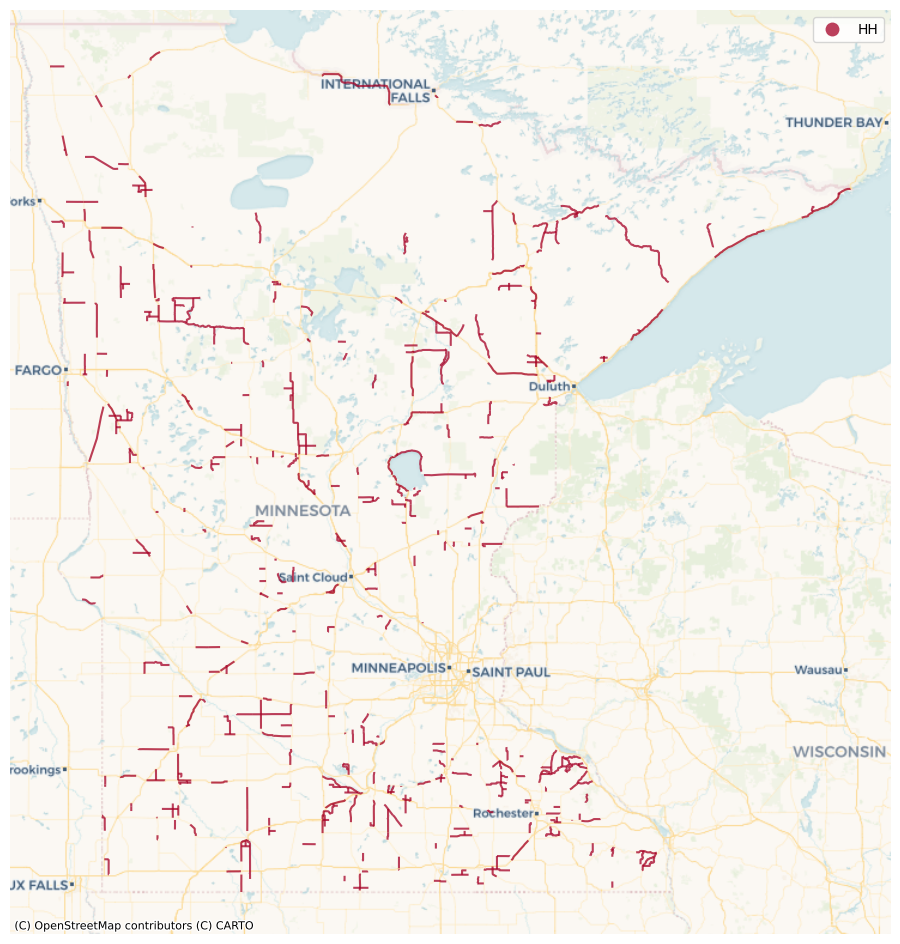

In [29]:
# Mapping Network LISA (Rate - Fuzzy) Results
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

aadt_gdf_plot = aadt_gdf.loc[(aadt_gdf.LISA_RATE_FUZZY == "HH")]

aadt_gdf_plot.to_crs(epsg=3857).plot(
    ax=ax,
    column="LISA_RATE_FUZZY",
    alpha=0.75,
    legend=True,
    cmap="RdYlBu",
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

ax.axis("off")
plt.show()

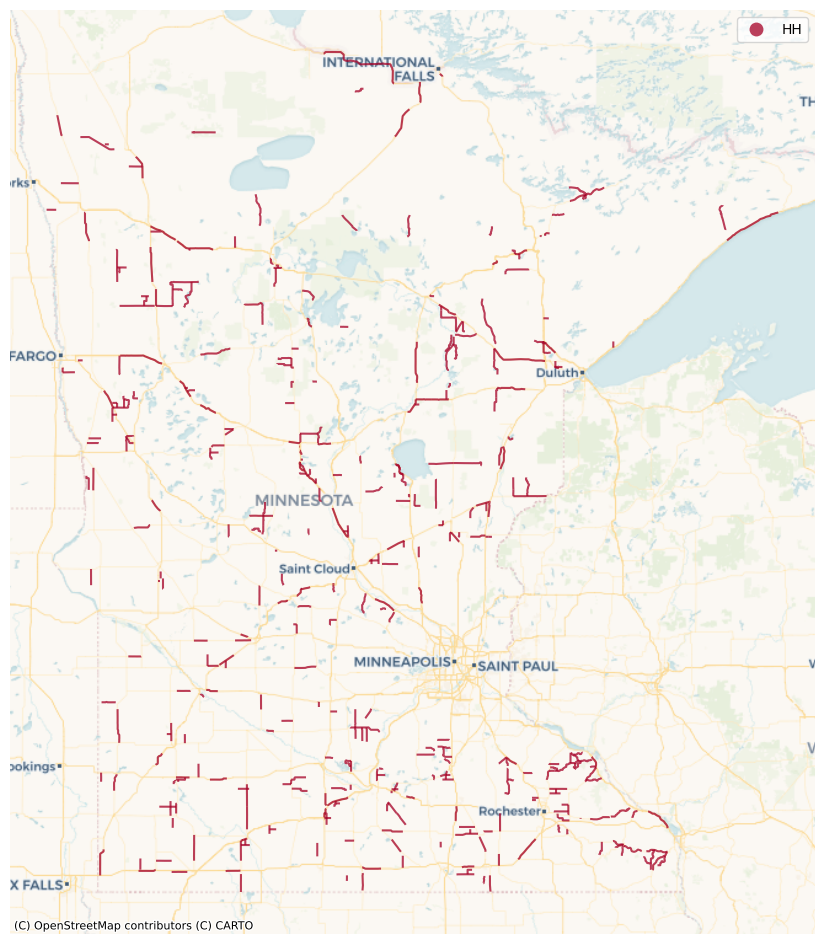

In [30]:
# Mapping Network LISA (Rate - KNN) Results
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

aadt_gdf_plot = aadt_gdf.loc[(aadt_gdf.LISA_RATE_KNN == "HH")]

aadt_gdf_plot.to_crs(epsg=3857).plot(
    ax=ax,
    column="LISA_RATE_KNN",
    alpha=0.75,
    legend=True,
    cmap="RdYlBu",
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

ax.axis("off")
plt.show()

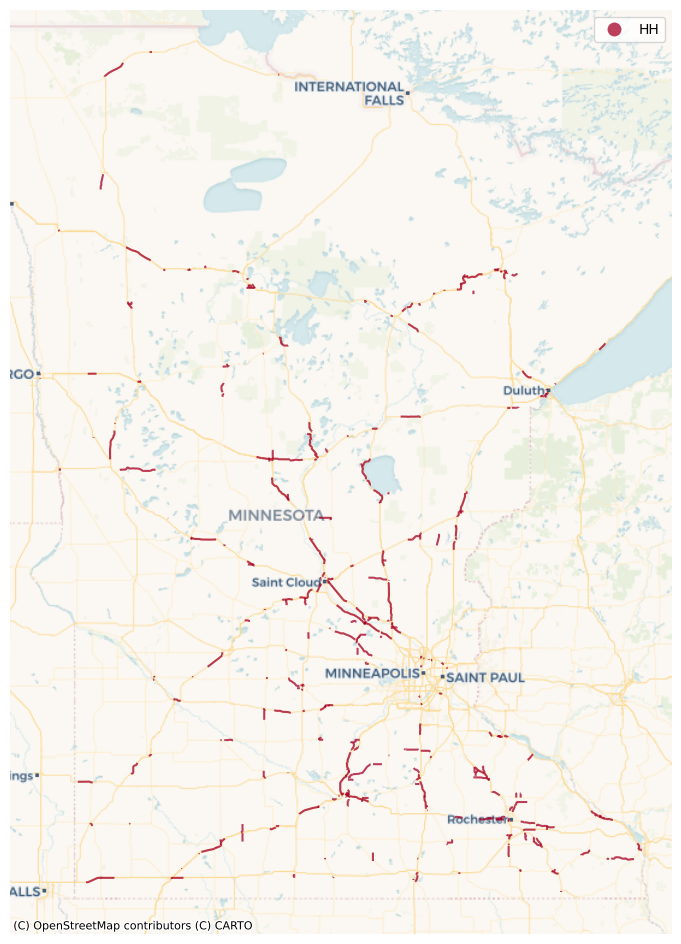

In [31]:
# Mapping Network LISA (Density - Fuzzy) Results
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

aadt_gdf_plot = aadt_gdf.loc[(aadt_gdf.LISA_DENSITY_FUZZY == "HH")]

aadt_gdf_plot.to_crs(epsg=3857).plot(
    ax=ax,
    column="LISA_DENSITY_FUZZY",
    alpha=0.75,
    legend=True,
    cmap="RdYlBu",
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

ax.axis("off")
plt.show()

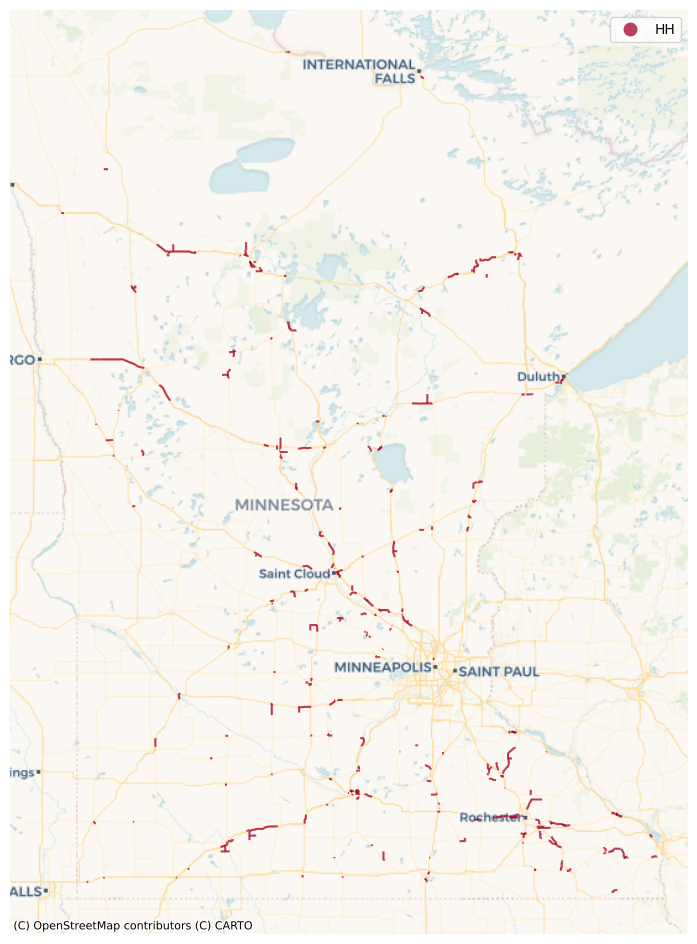

In [32]:
# Mapping Network LISA (Density - KNN) Results
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

aadt_gdf_plot = aadt_gdf.loc[(aadt_gdf.LISA_DENSITY_KNN == "HH")]

aadt_gdf_plot.to_crs(epsg=3857).plot(
    ax=ax,
    column="LISA_DENSITY_KNN",
    alpha=0.75,
    legend=True,
    cmap="RdYlBu",
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

ax.axis("off")
plt.show()

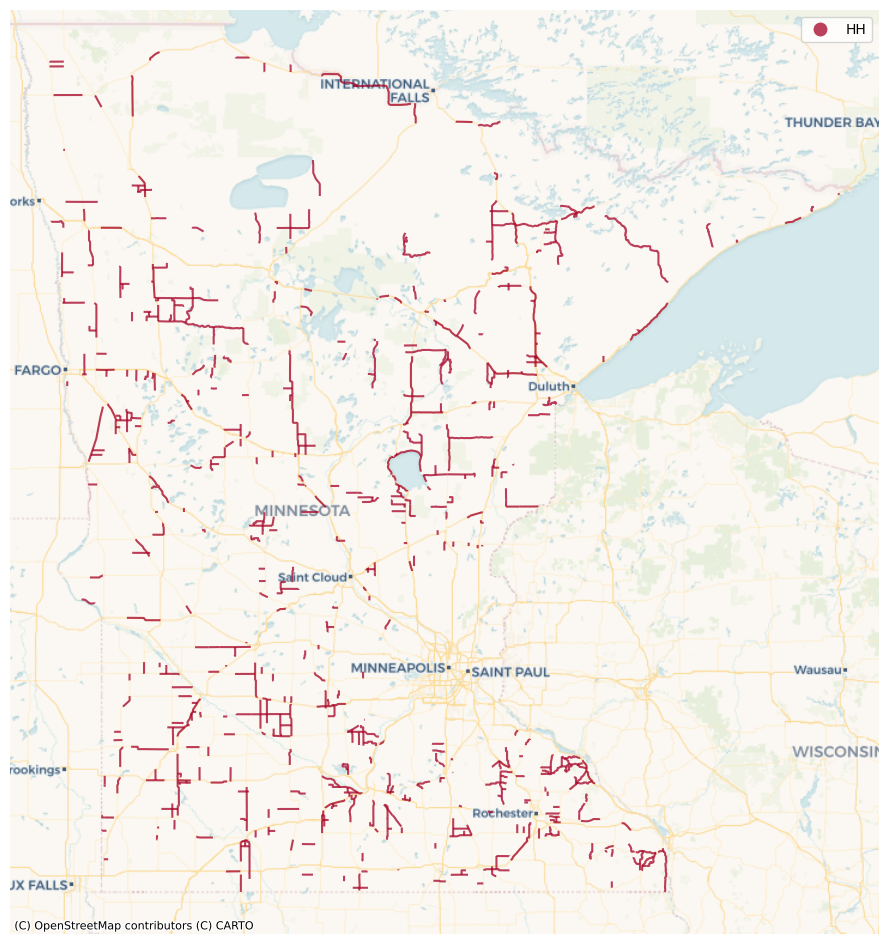

In [33]:
# Mapping Network LISA (Intensity - Fuzzy) Results
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

aadt_gdf_plot = aadt_gdf.loc[(aadt_gdf.LISA_INTENSITY_FUZZY == "HH")]

aadt_gdf_plot.to_crs(epsg=3857).plot(
    ax=ax,
    column="LISA_INTENSITY_FUZZY",
    alpha=0.75,
    legend=True,
    cmap="RdYlBu",
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

ax.axis("off")
plt.show()

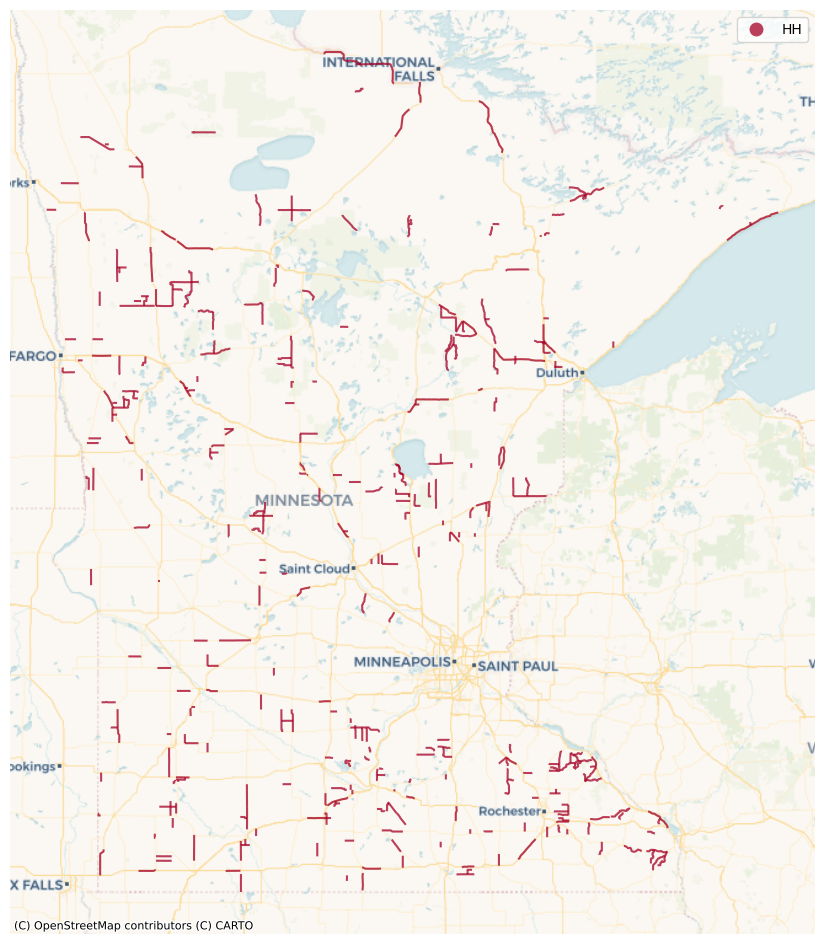

In [34]:
# Mapping Network LISA (Intensity - KNN) Results
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

aadt_gdf_plot = aadt_gdf.loc[(aadt_gdf.LISA_INTENSITY_KNN == "HH")]

aadt_gdf_plot.to_crs(epsg=3857).plot(
    ax=ax,
    column="LISA_INTENSITY_KNN",
    alpha=0.75,
    legend=True,
    cmap="RdYlBu",
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

ax.axis("off")
plt.show()

### Adding to Grid

In [35]:
# Network LISA - Rate - Fuzzy (5000)
n_f_lisa_rate_hotspots = aadt_gdf.loc[aadt_gdf.LISA_RATE_FUZZY == "HH"]
n_f_lisa_rate_grid_5000 = gpd.sjoin(grid_5000, n_f_lisa_rate_hotspots)

grid_5000["LISA_RATE_FUZZY"] = 0

for i in list(n_f_lisa_rate_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "LISA_RATE_FUZZY"] = 1

In [36]:
# Network LISA - Rate - Fuzzy (10000)
n_f_lisa_rate_hotspots = aadt_gdf.loc[aadt_gdf.LISA_RATE_FUZZY == "HH"]
n_f_lisa_rate_grid_10000 = gpd.sjoin(grid_10000, n_f_lisa_rate_hotspots)

grid_10000["LISA_RATE_FUZZY"] = 0

for i in list(n_f_lisa_rate_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "LISA_RATE_FUZZY"] = 1

In [37]:
# Network LISA - Rate - Fuzzy (25000)
n_f_lisa_rate_hotspots = aadt_gdf.loc[aadt_gdf.LISA_RATE_FUZZY == "HH"]
n_f_lisa_rate_grid_25000 = gpd.sjoin(grid_25000, n_f_lisa_rate_hotspots)

grid_25000["LISA_RATE_FUZZY"] = 0

for i in list(n_f_lisa_rate_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "LISA_RATE_FUZZY"] = 1

In [38]:
# Network LISA - Density - Fuzzy (5000)
n_f_lisa_density_hotspots = aadt_gdf.loc[aadt_gdf.LISA_DENSITY_FUZZY == "HH"]
n_f_lisa_density_grid_5000 = gpd.sjoin(grid_5000, n_f_lisa_density_hotspots)

grid_5000["LISA_DENSITY_FUZZY"] = 0

for i in list(n_f_lisa_density_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "LISA_DENSITY_FUZZY"] = 1

In [39]:
# Network LISA - Density - Fuzzy (10000)
n_f_lisa_density_hotspots = aadt_gdf.loc[aadt_gdf.LISA_DENSITY_FUZZY == "HH"]
n_f_lisa_density_grid_10000 = gpd.sjoin(grid_10000, n_f_lisa_density_hotspots)

grid_10000["LISA_DENSITY_FUZZY"] = 0

for i in list(n_f_lisa_density_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "LISA_DENSITY_FUZZY"] = 1

In [40]:
# Network LISA - Density - Fuzzy (25000)
n_f_lisa_density_hotspots = aadt_gdf.loc[aadt_gdf.LISA_DENSITY_FUZZY == "HH"]
n_f_lisa_density_grid_25000 = gpd.sjoin(grid_25000, n_f_lisa_density_hotspots)

grid_25000["LISA_DENSITY_FUZZY"] = 0

for i in list(n_f_lisa_density_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "LISA_DENSITY_FUZZY"] = 1

In [41]:
# Network LISA - Intensity - Fuzzy (5000)
n_f_lisa_intensity_hotspots = aadt_gdf.loc[aadt_gdf.LISA_INTENSITY_FUZZY == "HH"]
n_f_lisa_intensity_grid_5000 = gpd.sjoin(grid_5000, n_f_lisa_intensity_hotspots)

grid_5000["LISA_INTENSITY_FUZZY"] = 0

for i in list(n_f_lisa_intensity_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "LISA_INTENSITY_FUZZY"] = 1

In [42]:
# Network LISA - Intensity - Fuzzy (10000)
n_f_lisa_intensity_hotspots = aadt_gdf.loc[aadt_gdf.LISA_INTENSITY_FUZZY == "HH"]
n_f_lisa_intensity_grid_10000 = gpd.sjoin(grid_10000, n_f_lisa_intensity_hotspots)

grid_10000["LISA_INTENSITY_FUZZY"] = 0

for i in list(n_f_lisa_intensity_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "LISA_INTENSITY_FUZZY"] = 1

In [43]:
# Network LISA - Intensity - Fuzzy (25000)
n_f_lisa_intensity_hotspots = aadt_gdf.loc[aadt_gdf.LISA_INTENSITY_FUZZY == "HH"]
n_f_lisa_intensity_grid_25000 = gpd.sjoin(grid_25000, n_f_lisa_intensity_hotspots)

grid_25000["LISA_INTENSITY_FUZZY"] = 0

for i in list(n_f_lisa_intensity_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "LISA_INTENSITY_FUZZY"] = 1

In [44]:
# Network LISA - Rate - KNN (5000)
n_k_lisa_rate_hotspots = aadt_gdf.loc[aadt_gdf.LISA_RATE_KNN == "HH"]
n_k_lisa_rate_grid_5000 = gpd.sjoin(grid_5000, n_k_lisa_rate_hotspots)

grid_5000["LISA_RATE_KNN"] = 0

for i in list(n_k_lisa_rate_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "LISA_RATE_KNN"] = 1

In [45]:
# Network LISA - Rate - KNN (10000)
n_k_lisa_rate_hotspots = aadt_gdf.loc[aadt_gdf.LISA_RATE_KNN == "HH"]
n_k_lisa_rate_grid_10000 = gpd.sjoin(grid_10000, n_k_lisa_rate_hotspots)

grid_10000["LISA_RATE_KNN"] = 0

for i in list(n_k_lisa_rate_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "LISA_RATE_KNN"] = 1

In [46]:
# Network LISA - Rate - KNN (25000)
n_k_lisa_rate_hotspots = aadt_gdf.loc[aadt_gdf.LISA_RATE_KNN == "HH"]
n_k_lisa_rate_grid_25000 = gpd.sjoin(grid_25000, n_k_lisa_rate_hotspots)

grid_25000["LISA_RATE_KNN"] = 0

for i in list(n_k_lisa_rate_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "LISA_RATE_KNN"] = 1

In [47]:
# Network LISA - Density - KNN (5000)
n_k_lisa_density_hotspots = aadt_gdf.loc[aadt_gdf.LISA_DENSITY_KNN == "HH"]
n_k_lisa_density_grid_5000 = gpd.sjoin(grid_5000, n_k_lisa_density_hotspots)

grid_5000["LISA_DENSITY_KNN"] = 0

for i in list(n_k_lisa_density_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "LISA_DENSITY_KNN"] = 1

In [48]:
# Network LISA - Density - KNN (10000)
n_k_lisa_density_hotspots = aadt_gdf.loc[aadt_gdf.LISA_DENSITY_KNN == "HH"]
n_k_lisa_density_grid_10000 = gpd.sjoin(grid_10000, n_k_lisa_density_hotspots)

grid_10000["LISA_DENSITY_KNN"] = 0

for i in list(n_k_lisa_density_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "LISA_DENSITY_KNN"] = 1

In [49]:
# Network LISA - Density - KNN (25000)
n_k_lisa_density_hotspots = aadt_gdf.loc[aadt_gdf.LISA_DENSITY_KNN == "HH"]
n_k_lisa_density_grid_25000 = gpd.sjoin(grid_25000, n_k_lisa_density_hotspots)

grid_25000["LISA_DENSITY_KNN"] = 0

for i in list(n_k_lisa_density_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "LISA_DENSITY_KNN"] = 1

In [50]:
# Network LISA - Intensity - KNN (5000)
n_k_lisa_intensity_hotspots = aadt_gdf.loc[aadt_gdf.LISA_INTENSITY_KNN == "HH"]
n_k_lisa_intensity_grid_5000 = gpd.sjoin(grid_5000, n_k_lisa_intensity_hotspots)

grid_5000["LISA_INTENSITY_KNN"] = 0

for i in list(n_k_lisa_intensity_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "LISA_INTENSITY_KNN"] = 1

In [51]:
# Network LISA - Intensity - KNN (10000)
n_k_lisa_intensity_hotspots = aadt_gdf.loc[aadt_gdf.LISA_INTENSITY_KNN == "HH"]
n_k_lisa_intensity_grid_10000 = gpd.sjoin(grid_10000, n_k_lisa_intensity_hotspots)

grid_10000["LISA_INTENSITY_KNN"] = 0

for i in list(n_k_lisa_intensity_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "LISA_INTENSITY_KNN"] = 1

In [52]:
# Network LISA - Intensity - KNN (25000)
n_k_lisa_intensity_hotspots = aadt_gdf.loc[aadt_gdf.LISA_INTENSITY_KNN == "HH"]
n_k_lisa_intensity_grid_25000 = gpd.sjoin(grid_25000, n_k_lisa_intensity_hotspots)

grid_25000["LISA_INTENSITY_KNN"] = 0

for i in list(n_k_lisa_intensity_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "LISA_INTENSITY_KNN"] = 1

## A-DBSCAN

### Running A-DBSCAN

Several options for parameters were determined, which will be utilized here.

**Parameters**
1. $\epsilon$ = 8424 meters, Minimum Samples = 47 accidents (Average eps, All CTUs)
2. $\epsilon$ = 8424 meters, Minimum Samples = 107 accidents (Average eps, HH CTUs)
3. $\epsilon$ = 8424 meters, Minimum Samples = 111 accidents (Average eps, HH/HL CTUs)
4. $\epsilon$ = 9776 meters, Minimum Samples = 64 accidents (Median eps, All CTUs)
5. $\epsilon$ = 9776 meters, Minimum Samples = 144 accidents (Median eps, HH CTUs)
6. $\epsilon$ = 9776 meters, Minimum Samples = 150 accidents (Median eps, HH/HL CTUs)

In [53]:
# Get XY Coordinates
incidents_gdf["X"] = incidents_gdf.geometry.x
incidents_gdf["Y"] = incidents_gdf.geometry.y

incidents_gdf = incidents_gdf.drop(["x", "y"], axis=1)

incidents_gdf.head()

,icr,incident_type,incident_date,district,location_description,road_condition,vehicles_involved,city_id,geometry,X,Y
0,20601015,Injury,2020-03-04 07:35:00,2600 St. Cloud,"Highway 4 at County Road 28, Danielson Twp, Me...",Dry,2,2,POINT (366373.682 4988466.207),366373.681889,4.988466e+06
1,17901947,Injury,2017-09-09 18:39:00,2900 Detroit Lakes,"Eastbound Hwy 10 between Bluffton and Wadena, ...",Dry,1,3,POINT (328496.996 5148365.954),328496.995648,5.148366e+06
2,19901575,Injury,2019-07-28 13:28:00,2900 Detroit Lakes,"10 Highway / 77 County Road, Bluffton, Otter T...",Wet,1,3,POINT (328437.848 5148484.537),328437.848091,5.148485e+06
3,20902058,Injury,2020-12-07 16:30:00,2900 Detroit Lakes,"Westbound Hwy 10 MP87, BLUFFTON TWP, Otter Tai...",Dry,1,3,POINT (327648.687 5148486.120),327648.686590,5.148486e+06
4,17900227,Injury,2017-01-21 10:58:00,2900 Detroit Lakes,"East bound Hwy 10 west of Bluffton, Bluffton T...",Wet,3,3,POINT (327648.687 5148486.120),327648.686590,5.148486e+06


In [54]:
# Function to run A-DBSCAN & Plot
def run_adbscan(df, eps, min_samples):
    # Create Model
    np.random.seed(10)
    
    adbs = ADBSCAN(
        eps, min_samples, pct_exact=0.5, reps=50, keep_solus=True
    )
    
    # Fit Model
    adbs.fit(df)
    
    # Get Footprints
    adbs_polys = get_cluster_boundary(
        adbs.votes["lbls"], df, crs=df.crs
    )
    
    adbs_footprints = gpd.GeoDataFrame({"geometry": adbs_polys})
    
    # Mapping A-DBSCAN Results
    fig, ax = plt.subplots(1, 1, figsize=(12, 12))

    ctu_gdf.to_crs(epsg=3857).plot(
        ax=ax,
        alpha=0
    )

    adbs_footprints.to_crs(epsg=3857).plot(
        ax=ax,
        alpha=0.75,
    )

    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)

    ax.axis("off")
    plt.show()
    
    return adbs_footprints

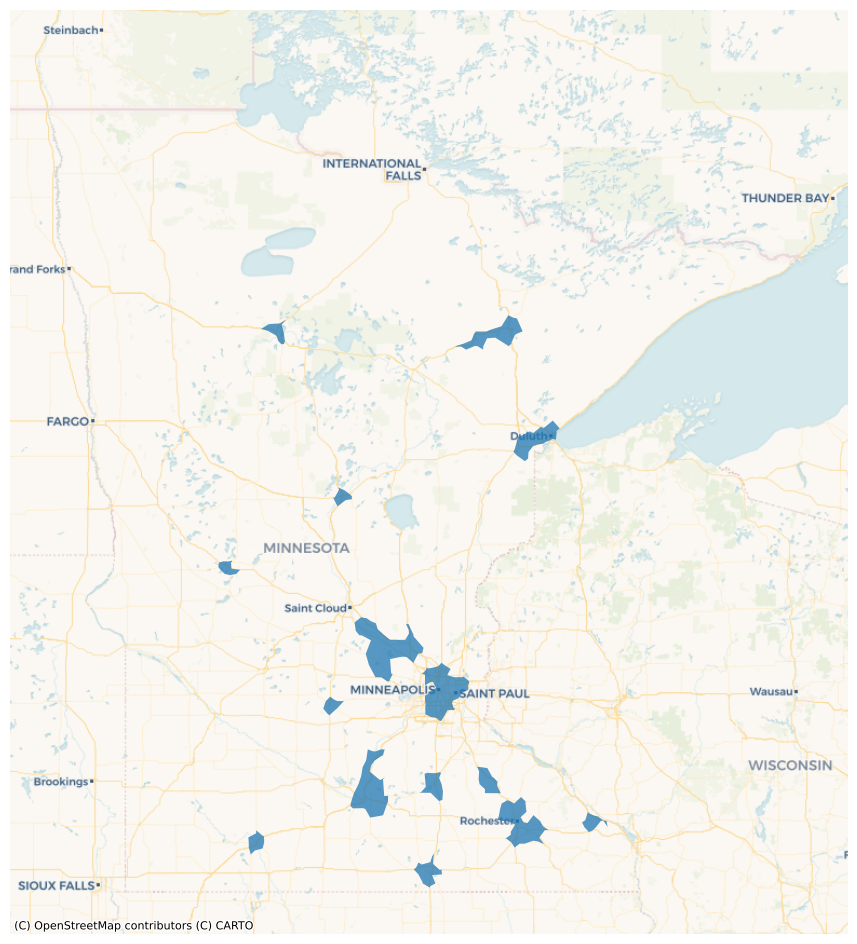

In [55]:
# Parameter Set 1
adbs_mean_all = run_adbscan(incidents_gdf, 8424, 47)

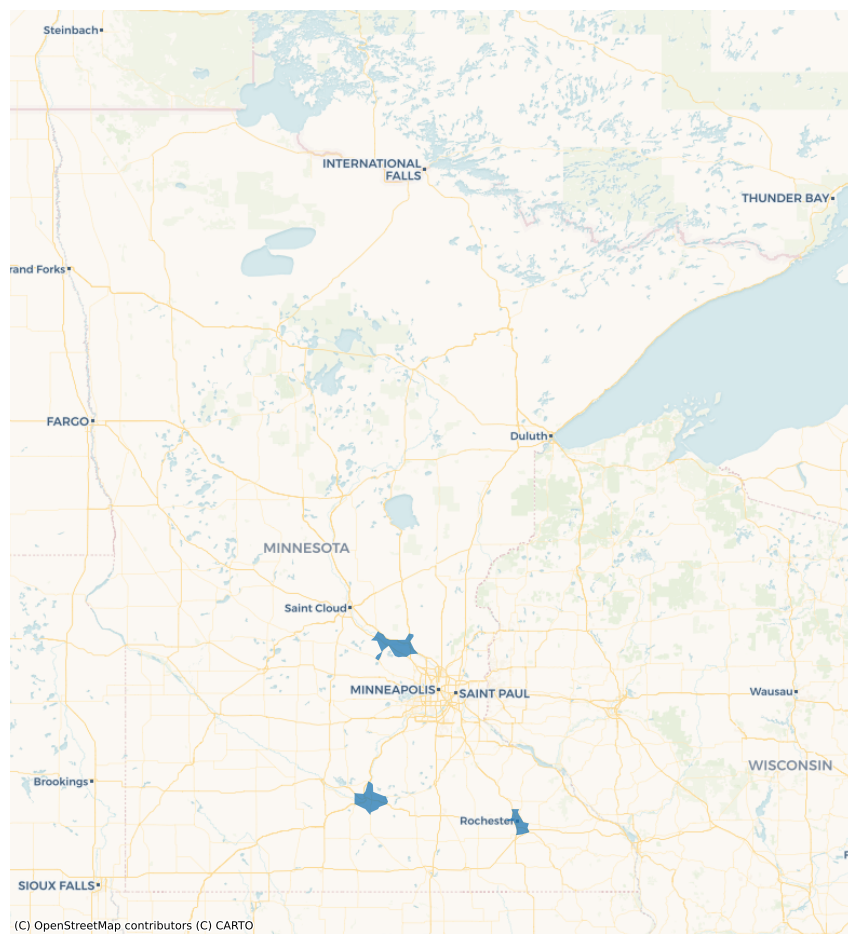

In [56]:
# Parameter Set 2
adbs_mean_hh = run_adbscan(incidents_gdf, 8424, 107)

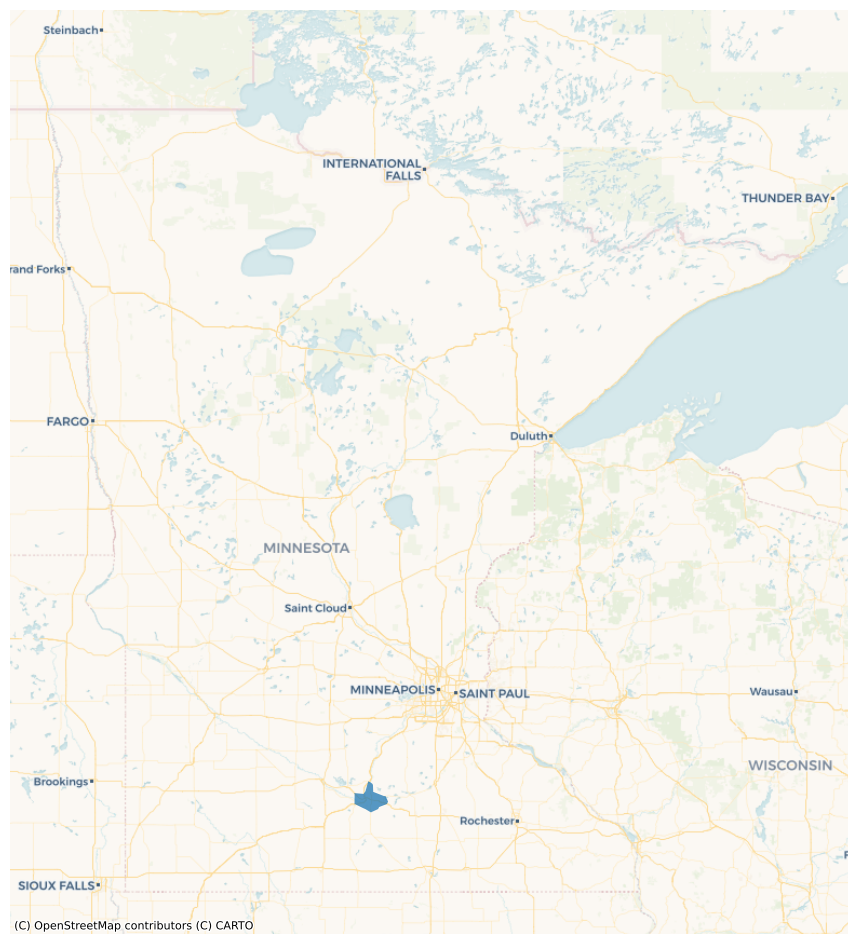

In [57]:
# Parameter Set 3
adbs_mean_hhhl = run_adbscan(incidents_gdf, 8424, 111)

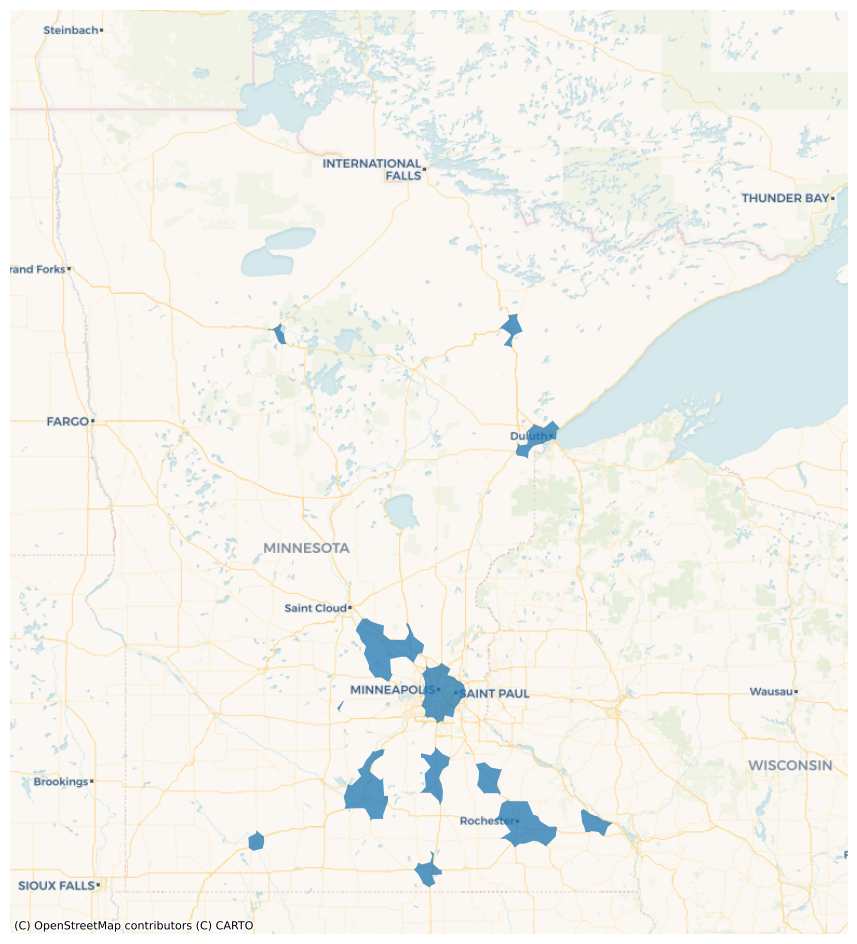

In [58]:
# Parameter Set 4
adbs_med_all = run_adbscan(incidents_gdf, 9776, 64)

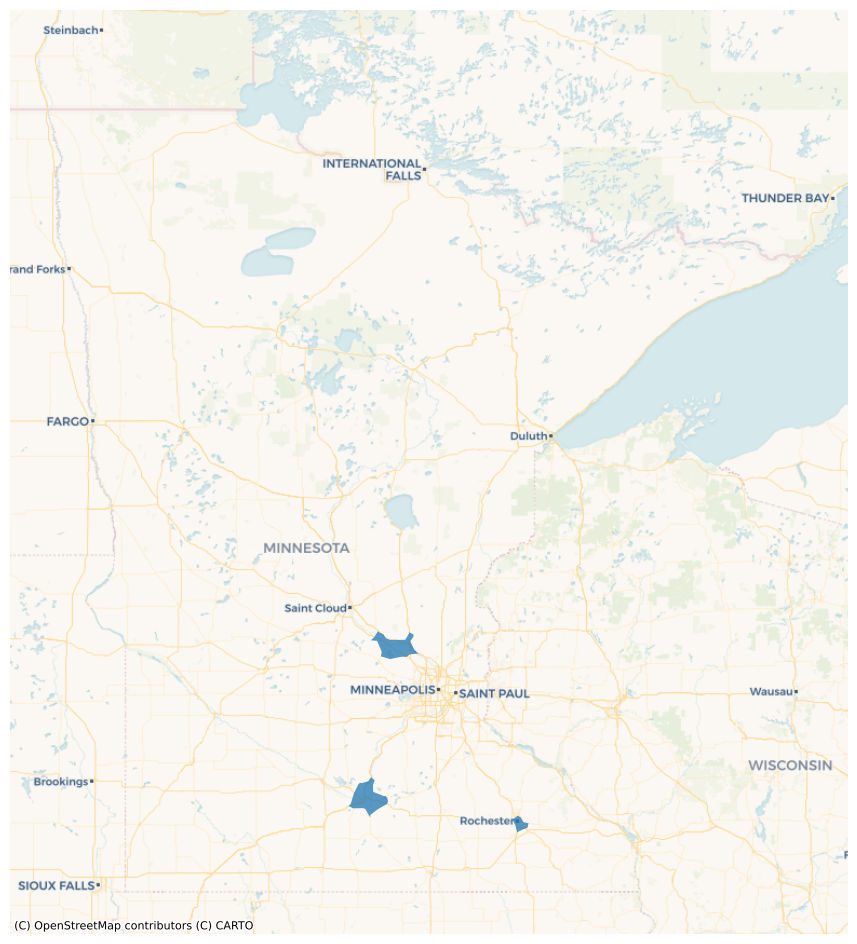

In [59]:
# Parameter Set 5
adbs_med_hh = run_adbscan(incidents_gdf, 9776, 144)

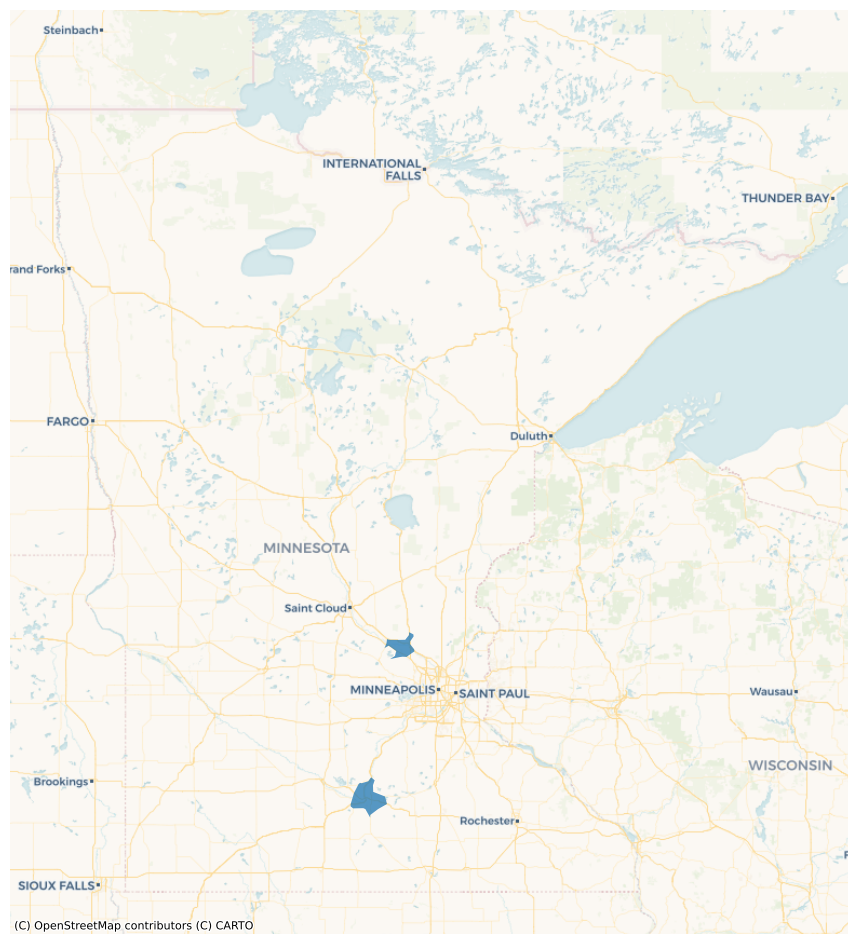

In [60]:
# Parameter Set 6
adbs_med_hhhl = run_adbscan(incidents_gdf, 9776, 150)

### Adding to Grid

In [61]:
# A-DBSCAN - Parameter Set 1 (5000)
adbscan_p1_grid_5000 = gpd.sjoin(grid_5000, adbs_mean_all)

grid_5000["ADBSCAN_MEAN_ALL"] = 0

for i in list(adbscan_p1_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "ADBSCAN_MEAN_ALL"] = 1

In [62]:
# A-DBSCAN - Parameter Set 1 (10000)
adbscan_p1_grid_10000 = gpd.sjoin(grid_10000, adbs_mean_all)

grid_10000["ADBSCAN_MEAN_ALL"] = 0

for i in list(adbscan_p1_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "ADBSCAN_MEAN_ALL"] = 1

In [63]:
# A-DBSCAN - Parameter Set 1 (25000)
adbscan_p1_grid_25000 = gpd.sjoin(grid_25000, adbs_mean_all)

grid_25000["ADBSCAN_MEAN_ALL"] = 0

for i in list(adbscan_p1_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "ADBSCAN_MEAN_ALL"] = 1

In [64]:
# A-DBSCAN - Parameter Set 2 (5000)
adbscan_p2_grid_5000 = gpd.sjoin(grid_5000, adbs_mean_hh)

grid_5000["ADBSCAN_MEAN_HH"] = 0

for i in list(adbscan_p2_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "ADBSCAN_MEAN_HH"] = 1

In [65]:
# A-DBSCAN - Parameter Set 2 (10000)
adbscan_p2_grid_10000 = gpd.sjoin(grid_10000, adbs_mean_hh)

grid_10000["ADBSCAN_MEAN_HH"] = 0

for i in list(adbscan_p2_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "ADBSCAN_MEAN_HH"] = 1

In [66]:
# A-DBSCAN - Parameter Set 2 (25000)
adbscan_p2_grid_25000 = gpd.sjoin(grid_25000, adbs_mean_hh)

grid_25000["ADBSCAN_MEAN_HH"] = 0

for i in list(adbscan_p2_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "ADBSCAN_MEAN_HH"] = 1

In [67]:
# A-DBSCAN - Parameter Set 3 (5000)
adbscan_p3_grid_5000 = gpd.sjoin(grid_5000, adbs_mean_hhhl)

grid_5000["ADBSCAN_MEAN_HHHL"] = 0

for i in list(adbscan_p3_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "ADBSCAN_MEAN_HHHL"] = 1

In [68]:
# A-DBSCAN - Parameter Set 3 (10000)
adbscan_p3_grid_10000 = gpd.sjoin(grid_10000, adbs_mean_hhhl)

grid_10000["ADBSCAN_MEAN_HHHL"] = 0

for i in list(adbscan_p3_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "ADBSCAN_MEAN_HHHL"] = 1

In [69]:
# A-DBSCAN - Parameter Set 3 (25000)
adbscan_p3_grid_25000 = gpd.sjoin(grid_25000, adbs_mean_hhhl)

grid_25000["ADBSCAN_MEAN_HHHL"] = 0

for i in list(adbscan_p3_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "ADBSCAN_MEAN_HHHL"] = 1

In [70]:
# A-DBSCAN - Parameter Set 4 (5000)
adbscan_p4_grid_5000 = gpd.sjoin(grid_5000, adbs_med_all)

grid_5000["ADBSCAN_MED_ALL"] = 0

for i in list(adbscan_p4_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "ADBSCAN_MED_ALL"] = 1

In [71]:
# A-DBSCAN - Parameter Set 4 (10000)
adbscan_p4_grid_10000 = gpd.sjoin(grid_10000, adbs_med_all)

grid_10000["ADBSCAN_MED_ALL"] = 0

for i in list(adbscan_p4_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "ADBSCAN_MED_ALL"] = 1

In [72]:
# A-DBSCAN - Parameter Set 4 (25000)
adbscan_p4_grid_25000 = gpd.sjoin(grid_25000, adbs_med_all)

grid_25000["ADBSCAN_MED_ALL"] = 0

for i in list(adbscan_p4_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "ADBSCAN_MED_ALL"] = 1

In [73]:
# A-DBSCAN - Parameter Set 5 (5000)
adbscan_p5_grid_5000 = gpd.sjoin(grid_5000, adbs_med_hh)

grid_5000["ADBSCAN_MED_HH"] = 0

for i in list(adbscan_p5_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "ADBSCAN_MED_HH"] = 1

In [74]:
# A-DBSCAN - Parameter Set 5 (10000)
adbscan_p5_grid_10000 = gpd.sjoin(grid_10000, adbs_med_hh)

grid_10000["ADBSCAN_MED_HH"] = 0

for i in list(adbscan_p5_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "ADBSCAN_MED_HH"] = 1

In [75]:
# A-DBSCAN - Parameter Set 5 (25000)
adbscan_p5_grid_25000 = gpd.sjoin(grid_25000, adbs_med_hh)

grid_25000["ADBSCAN_MED_HH"] = 0

for i in list(adbscan_p5_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "ADBSCAN_MED_HH"] = 1

In [76]:
# A-DBSCAN - Parameter Set 6 (5000)
adbscan_p6_grid_5000 = gpd.sjoin(grid_5000, adbs_med_hhhl)

grid_5000["ADBSCAN_MED_HHHL"] = 0

for i in list(adbscan_p6_grid_5000.index):
    grid_5000.loc[grid_5000["index"] == i, "ADBSCAN_MED_HHHL"] = 1

In [77]:
# A-DBSCAN - Parameter Set 6 (10000)
adbscan_p6_grid_10000 = gpd.sjoin(grid_10000, adbs_med_hhhl)

grid_10000["ADBSCAN_MED_HHHL"] = 0

for i in list(adbscan_p6_grid_10000.index):
    grid_10000.loc[grid_10000["index"] == i, "ADBSCAN_MED_HHHL"] = 1

In [78]:
# A-DBSCAN - Parameter Set 6 (25000)
adbscan_p6_grid_25000 = gpd.sjoin(grid_25000, adbs_med_hhhl)

grid_25000["ADBSCAN_MED_HHHL"] = 0

for i in list(adbscan_p6_grid_25000.index):
    grid_25000.loc[grid_25000["index"] == i, "ADBSCAN_MED_HHHL"] = 1

## Export Grids

In [79]:
# Export as EPSG 4326
grid_5000 = grid_5000.to_crs(epsg=4326)
grid_5000.to_file("../data/results/grid_5000_results.geojson", driver="GeoJSON")

In [80]:
# Export as EPSG 4326
grid_10000 = grid_10000.to_crs(epsg=4326)
grid_10000.to_file("../data/results/grid_10000_results.geojson", driver="GeoJSON")

In [81]:
# Export as EPSG 4326
grid_25000 = grid_25000.to_crs(epsg=4326)
grid_25000.to_file("../data/results/grid_25000_results.geojson", driver="GeoJSON")